# **Object Detection with Caltech-101 Dataset**

In this notebook, the [EfficientNetV2-S](https://arxiv.org/abs/2104.00298) model is fine-tuned using the [Caltech-101](https://data.caltech.edu/records/mzrjq-6wc02) dataset for the task of object detection. The goal is to predict the class of an object and the coordinates of its bounding box from a given image, where each image contains a single object from one class. This dataset includes RGB images distributed across 101 classes, along with their respective bounding boxes. Since the dataset does not provide a predefined split for training and testing, 80% of the data will be used for training and 20% for testing in this case.

The EfficientNetV2-S model is available on [TensorFlow Hub](https://www.kaggle.com/models?tfhub-redirect=true), a repository of pre-trained TensorFlow models. In this notebook, we use the `efficientnetv2-s-21k-ft1k` version, which has been pre-trained on the [ImageNet21K](https://github.com/Alibaba-MIIL/ImageNet21K) dataset and fine-tuned on [ImageNet1K](https://www.image-net.org/download.php). Compared to earlier versions like [EfficientNet](https://arxiv.org/abs/1905.11946), EfficientNetV2 offers faster training, fewer parameters, and superior performance.

## **Imports**

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import plotly.graph_objects as go
from google.colab import drive
import json
import os

## **Parameters**

In [ ]:
drive.mount("/content/drive/")

Mounted at /content/drive/


In [ ]:
epochs = 50
batch_size = 64
buffer_size = 1024
AUTOTUNE = tf.data.AUTOTUNE
SEED = 123
path_data = "/content/drive/MyDrive/Datasets/caltech101"
model_url = "gs://cloud-tpu-checkpoints/efficientnet/v2/hub/efficientnetv2-s-21k-ft1k/feature-vector"
new_size = (384, 384, 3)

## **Prepare the Dataset for Training**

### **Load the Dataset**

All dataset downloading and preliminary preprocessing for Caltech-101 were completed in the following notebook: [Preprocessing_Caltech-101](https://github.com/JersonGB22/ObjectDetection-TensorFlow/blob/main/Preprocessing/Preprocessing_Caltech-101.ipynb).

In [ ]:
path_train_data = os.path.join(path_data, "train.tfrecord")
path_test_data = os.path.join(path_data, "test.tfrecord")
path_metadata = os.path.join(path_data, "metadata.json")

In [ ]:
# Functions to load datasets stored in TFRecord format
def decode_tfrecord(sample):
  features = {
      "image": tf.io.FixedLenFeature((), tf.string),
      "label": tf.io.FixedLenFeature((), tf.int64),
      "box": tf.io.FixedLenFeature((4, ), tf.float32),
      "mask": tf.io.FixedLenFeature((), tf.string),
  }
  parsed_features = tf.io.parse_example(sample, features)

  image = tf.io.decode_jpeg(parsed_features["image"], channels=3)
  label = parsed_features["label"]
  box = parsed_features["box"]

  return image, (label, box)


def load_dataset(filename, size):
  dataset = tf.data.TFRecordDataset(filename)
  dataset = dataset.map(decode_tfrecord, num_parallel_calls=tf.data.AUTOTUNE)
  dataset = dataset.apply(tf.data.experimental.assert_cardinality(size))
  return dataset

In [ ]:
# Load the dataset metadata
with open(path_metadata, "r") as f:
  metadata = json.load(f)

train_size = metadata["size"]["train"]
test_size = metadata["size"]["test"]
class_names = np.array([name.capitalize() for name in metadata["class_names"]])
num_classes = len(class_names)

print("Number of classes:", num_classes)
print("Class names:", class_names)

Number of classes: 101
Class names: ['Accordion' 'Airplanes' 'Anchor' 'Ant' 'Barrel' 'Bass' 'Beaver'
 'Binocular' 'Bonsai' 'Brain' 'Brontosaurus' 'Buddha' 'Butterfly' 'Camera'
 'Cannon' 'Car side' 'Ceiling fan' 'Cellphone' 'Chair' 'Chandelier'
 'Cougar body' 'Cougar face' 'Crab' 'Crayfish' 'Crocodile'
 'Crocodile head' 'Cup' 'Dalmatian' 'Dollar bill' 'Dolphin' 'Dragonfly'
 'Electric guitar' 'Elephant' 'Emu' 'Euphonium' 'Ewer' 'Faces'
 'Faces easy' 'Ferry' 'Flamingo' 'Flamingo head' 'Garfield' 'Gerenuk'
 'Gramophone' 'Grand piano' 'Hawksbill' 'Headphone' 'Hedgehog'
 'Helicopter' 'Ibis' 'Inline skate' 'Joshua tree' 'Kangaroo' 'Ketch'
 'Lamp' 'Laptop' 'Leopards' 'Llama' 'Lobster' 'Lotus' 'Mandolin' 'Mayfly'
 'Menorah' 'Metronome' 'Minaret' 'Motorbikes' 'Nautilus' 'Octopus' 'Okapi'
 'Pagoda' 'Panda' 'Pigeon' 'Pizza' 'Platypus' 'Pyramid' 'Revolver' 'Rhino'
 'Rooster' 'Saxophone' 'Schooner' 'Scissors' 'Scorpion' 'Sea horse'
 'Snoopy' 'Soccer ball' 'Stapler' 'Starfish' 'Stegosaurus' 'Stop sig

In [ ]:
# Load the training and testing datasets
train_dataset = load_dataset(path_train_data, size=train_size)
test_dataset = load_dataset(path_test_data, size=test_size)

len(train_dataset), len(test_dataset)

(6941, 1736)

In [ ]:
# View an example from the training dataset
for image, (label, box) in train_dataset.take(1):
  print(image.shape)
  print(label)
  print(box)

(269, 300, 3)
tf.Tensor(26, shape=(), dtype=int64)
tf.Tensor([0.12639405 0.03333334 0.92565054 0.97333336], shape=(4,), dtype=float32)


### **Preprocessing and Data Augmentation**

To mitigate *overfitting* and achieve better results, it is crucial to apply data augmentation techniques, especially when the training dataset is small for many classes, as is the case with Caltech-101, which has 101 classes. Therefore, the functions ``random_flip_left_right`` were manually created to perform random horizontal flipping of the images, while simultaneously adjusting the coordinates of the corresponding bounding box, and ``random_translation`` to apply random horizontal and vertical translations, also adjusting the *bounding box* coordinates. These functions were implemented manually because TensorFlow does not provide predefined layers or functions that perform these operations randomly while taking *bounding boxes* into account. Additionally, TensorFlow's ``random_brightness`` and ``random_contrast`` functions are used to randomly adjust the brightness and contrast of the images. It is important to note that data augmentation should only be applied to the training dataset, not to the test set.

For preprocessing, it is only necessary to resize the images and normalize them to the range [0, 1].

In [ ]:
# Function for random horizontal flip
@tf.function
def random_flip_left_right(image, box):
  if tf.random.uniform(()) > 0.5:
    image = tf.image.flip_left_right(image)

    ymin, xmin, ymax, xmax = tf.unstack(box)
    xmin, xmax = 1 - xmax, 1 - xmin
    box = tf.stack([ymin, xmin, ymax, xmax])

  return image, box


# Function for random horizontal and vertical translation
@tf.function
def random_translation(image, box, height_factor=0.1, width_factor=0.1):
  shape = tf.shape(image)[:2]
  height, width = tf.cast(shape[0], tf.float32), tf.cast(shape[1], tf.float32)

  height_shift = tf.random.uniform((), -height_factor, height_factor) * height
  width_shift = tf.random.uniform((), -width_factor, width_factor) * width

  transformation = [[1, 0, width_shift, 0, 1, height_shift, 0, 0]]
  image = tf.raw_ops.ImageProjectiveTransformV3(
      images=image[None, :],
      transforms=tf.cast(transformation, tf.float32),
      output_shape=shape,
      fill_value=0,
      interpolation="BILINEAR",
      fill_mode="NEAREST"
  )[0]

  ymin, xmin, ymax, xmax = tf.unstack(box)
  ymin, ymax = ymin - height_shift / height, ymax - height_shift / height
  xmin, xmax = xmin - width_shift / width, xmax - width_shift / width
  box = tf.clip_by_value([ymin, xmin, ymax, xmax], 0, 1)

  return image, box


# Function for preprocessing and data augmentation
@tf.function
def preprocessing(image, note, training=True):
  image = tf.image.resize(image, new_size[:-1])
  label, box = note

  if training:
    image, box = random_flip_left_right(image, box)
    image, box = random_translation(image, box, height_factor=0.05, width_factor=0.05) #Most of the objects occupy nearly the entire image
    image = tf.image.random_brightness(image, 0.2)
    image = tf.image.random_contrast(image, 0.7, 1.3)

  image = image / 255
  return image, (label, box)

Since the training will take place on Google Colab's TPU and the model's loss function is customized, it is necessary to include the argument ``drop_remainder=True`` when creating batches in the datasets. This helps prevent the loss from becoming **``nan``** at the end of each epoch.

In [ ]:
# The loss of records is minimal compared to the sizes of the datasets
len(train_dataset) % batch_size, len(test_dataset) % batch_size

(29, 8)

In [ ]:
train_dataset = (
    train_dataset.
    map(preprocessing, num_parallel_calls=AUTOTUNE).
    shuffle(buffer_size, seed=SEED).
    batch(batch_size, drop_remainder=True).
    prefetch(AUTOTUNE)
)

test_dataset = (
    test_dataset.
    map(lambda x, y: preprocessing(x, y, training=False), num_parallel_calls=AUTOTUNE).
    batch(batch_size, drop_remainder=True).
    prefetch(AUTOTUNE)
)

In [ ]:
# Take a batch from the training dataset
for images, (labels, boxes) in train_dataset.take(1):
  print(images.shape)
  print(labels.shape)
  print(boxes.shape)

(64, 384, 384, 3)
(64,)
(64, 4)


**Function to display images along with their corresponding bounding boxes**

Bounding boxes can be plotted using the OpenCV library; however, it only allows coordinates of type ``int``, which can result in a loss of precision when drawing the bounding boxes. Therefore, in this case, Matplotlib is used, as it accepts ``float`` coordinates, providing greater accuracy.

In [ ]:
def show_images(images, labels, boxes, labels_pred=None, boxes_pred=None, num_examples=9,
                random=True, cmap="gray", axis="off", save=False, path=""):

  n = int(np.sqrt(num_examples))
  indices = np.arange(len(images))
  if random:
    np.random.shuffle(indices)

  fig, axes = plt.subplots(n, n, figsize=(2.35*n, 2.35*n))

  for i, ax in enumerate(axes.flat):
    image = images[indices[i]]
    label = labels[indices[i]]
    box = boxes[indices[i]]
    shape = image.shape

    image = tf.clip_by_value(image, 0, 1)
    ax.imshow(image, cmap=cmap)

    ymin, xmin, ymax, xmax = tuple(box)
    ymin, ymax = ymin*shape[0], ymax*shape[0]
    xmin, xmax = xmin*shape[1], xmax*shape[1]

    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.3, edgecolor="mediumblue", facecolor="none")
    ax.add_patch(rect)

    condition = (labels_pred is not None) and (boxes_pred is not None)

    y_coor = -0.065*shape[0] if condition  else -0.005*shape[0]
    ax.text(
        x=shape[1]/2, y=y_coor, s=f"Label: {class_names[label]}", color="mediumblue", fontsize=7,
        fontweight="bold", ha="center", va="bottom"
    )

    if condition:
      label_pred = labels_pred[indices[i]]
      box_pred = boxes_pred[indices[i]]

      ymin_pred, xmin_pred, ymax_pred, xmax_pred = tuple(box_pred)
      ymin_pred, ymax_pred = ymin_pred*shape[0], ymax_pred*shape[0]
      xmin_pred, xmax_pred = xmin_pred*shape[1], xmax_pred*shape[1]

      rect_pred = patches.Rectangle(
          (xmin_pred, ymin_pred), xmax_pred-xmin_pred, ymax_pred-ymin_pred,
          linewidth=1.3, edgecolor="red", facecolor="none"
      )
      ax.add_patch(rect_pred)

      ax.text(
          x=shape[1]/2, y=-0.005*shape[0], s=f"Pred: {class_names[label_pred]}", color="red", fontsize=7,
          fontweight="bold", ha="center", va="bottom"
      )
      ax.text(
          x=shape[1]/2, y=1.01*shape[0], s=f"IoU: {calculate_giou(box, box_pred).numpy():.2f}",
          fontsize=7, ha="center", va="top"
      )

    ax.axis(axis)

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path)

  plt.show()

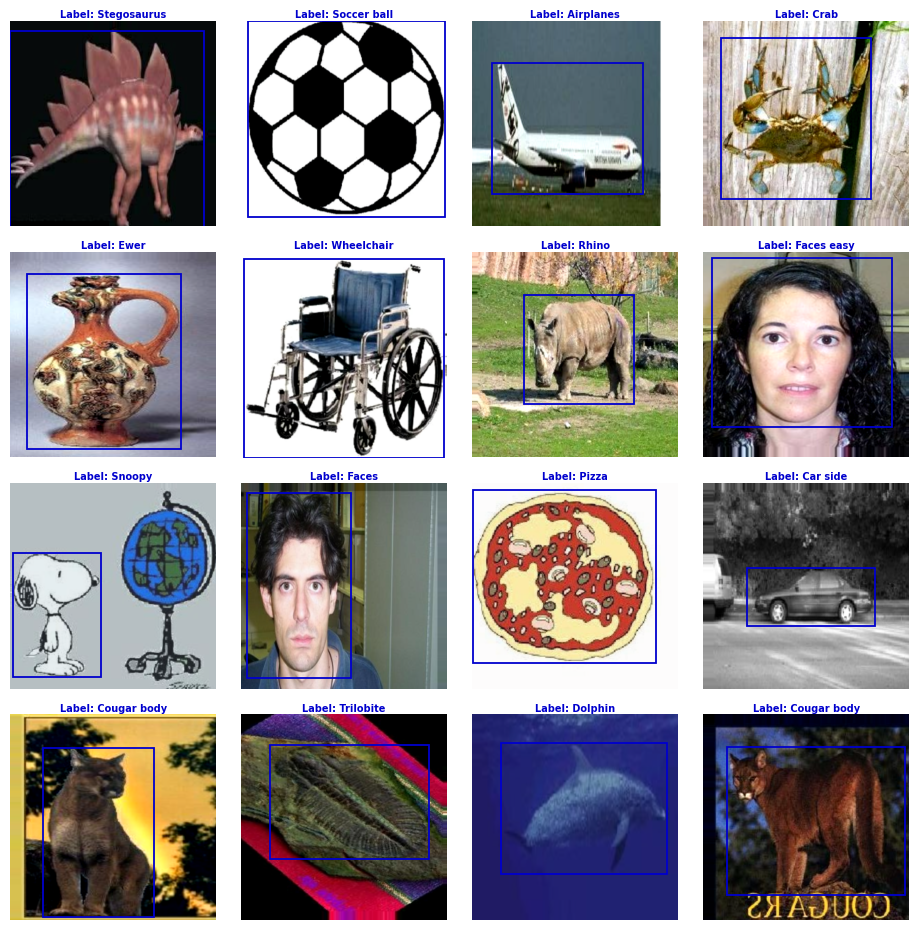

In [ ]:
# Some images from the training dataset after data augmentation
show_images(images, labels, boxes, num_examples=16, random=False)

## **Build and Compile the Model**

To speed up the fine-tuning process, Google Colab's TPU is utilized.

In [ ]:
# TPU setup

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu="local")
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.TPUStrategy(tpu)
  print("TPU initialized:")
  print("All devices: ", tf.config.list_logical_devices("TPU"))
except (ValueError, tf.errors.InvalidArgumentError, tf.errors.NotFoundError) as error:
  print(f"Error: {error}")

TPU initialized:
All devices:  [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]


In [ ]:
# Function to build the model
def build_model(model_url, image_size, dropout_rate=0.1, name=None):
  inputs = tf.keras.Input(shape=image_size)
  x = hub.KerasLayer(model_url, trainable=True)(inputs)
  x = tf.keras.layers.Dropout(dropout_rate)(x)

  classifier = tf.keras.layers.Dense(num_classes, activation="softmax", name="classifier")(x)
  box_regressor = tf.keras.layers.Dense(4, activation="sigmoid", name="box_regressor")(x)
  model = tf.keras.Model(inputs=inputs, outputs=[classifier, box_regressor], name=name)

  return model

In object detection, better results can be achieved by combining the standard loss for **bounding boxes** (Mean Squared Error or **MSE**) with the **GIoU** loss (Generalized Intersection over Union). GIoU is an improvement over the **IoU** (Intersection over Union) metric, which measures the overlap between the predicted and ground truth bounding boxes. While IoU only considers the common area between the two boxes, GIoU introduces an additional term that penalizes the lack of overlap, even when the boxes do not intersect. This helps improve model convergence, especially in scenarios where the predicted boxes are misaligned or fall outside the area of interest. For more details, see the following [article](https://giou.stanford.edu/GIoU.pdf).

The model's performance in predicting bounding boxes is better assessed using the IoU metric, which is calculated as the ratio of the intersection area to the union area of two boxes. Conventional accuracy is not suitable for this task. The IoU value ranges from 0 to 1, with 1 indicating a perfect match.

Below, both the **IoU** metric and **GIoU** loss are implemented using TensorFlow to improve results:

In [ ]:
@tf.function
def calculate_giou(box_true, box_pred, metric="iou"):
  # Convert the box coordinates to float32
  box_true = tf.cast(box_true, tf.float32)
  box_pred = tf.cast(box_pred, tf.float32)

  # Extract the minimum and maximum coordinates of the boxes
  ymin_true, xmin_true, ymax_true, xmax_true = tf.unstack(box_true, axis=-1)
  ymin_pred, xmin_pred, ymax_pred, xmax_pred = tf.unstack(box_pred, axis=-1)

  # Calculate the areas of the true and predicted boxes
  width_true = tf.maximum(xmax_true - xmin_true, 0)
  height_true = tf.maximum(ymax_true - ymin_true, 0)
  width_pred = tf.maximum(xmax_pred - xmin_pred, 0)
  height_pred = tf.maximum(ymax_pred - ymin_pred, 0)
  area_true = width_true * height_true
  area_pred = width_pred * height_pred

  # Calculate the intersection area
  intersect_xmin = tf.maximum(xmin_true, xmin_pred)
  intersect_ymin = tf.maximum(ymin_true, ymin_pred)
  intersect_xmax = tf.minimum(xmax_true, xmax_pred)
  intersect_ymax = tf.minimum(ymax_true, ymax_pred)
  intersect_width = tf.maximum(intersect_xmax - intersect_xmin, 0)
  intersect_height = tf.maximum(intersect_ymax - intersect_ymin, 0)
  intersect_area = intersect_width * intersect_height

  # Calculate the union area
  union_area = area_true + area_pred - intersect_area

  # Calculate IoU
  iou = tf.math.divide_no_nan(intersect_area, union_area)

  # Return IoU if required
  if metric == "iou":
    return iou

  # Calculate the area of the minimum enclosing box
  enclose_xmin = tf.minimum(xmin_true, xmin_pred)
  enclose_ymin = tf.minimum(ymin_true, ymin_pred)
  enclose_xmax = tf.maximum(xmax_true, xmax_pred)
  enclose_ymax = tf.maximum(ymax_true, ymax_pred)
  enclose_width = tf.maximum(enclose_xmax - enclose_xmin, 0)
  enclose_height = tf.maximum(enclose_ymax - enclose_ymin, 0)
  enclose_area = enclose_width * enclose_height

  # Calculate GIoU
  giou = iou - tf.math.divide_no_nan(enclose_area - union_area, enclose_area)
  return giou

In [ ]:
# Custom metric to calculate IoU
@tf.keras.utils.register_keras_serializable()
def metric_iou(box_true, box_pred):
  return tf.reduce_mean(calculate_giou(box_true, box_pred))


# Custom loss that combines MSE and GIoU for the bounding boxes
@tf.keras.utils.register_keras_serializable()
def mse_giou_loss(box_true, box_pred):
  mse = tf.keras.losses.MeanSquaredError(reduction=tf.keras.losses.Reduction.NONE)
  loss_mse = tf.reduce_mean(mse(box_true, box_pred))

  loss_giou = 1 - calculate_giou(box_true, box_pred, metric="giou")
  loss_giou = tf.reduce_mean(loss_giou)

  loss = 5*loss_mse + 2*loss_giou
  return loss

The total loss of the model is given by the following formula:

**$$ \text{TotalLoss} = 1 \times \text{SparseCategoricalCrossentropy} + 3 \times (2 \times \text{GIoULoss} + 5 \times \text{MeanSquaredError}) $$**

The loss of the ``box_regressor`` carries more weight due to the limited number of training images, causing the loss of the ``classifier`` to converge very quickly.


In [ ]:
tf.keras.backend.clear_session()

with strategy.scope():
  model = build_model(model_url, new_size, name="EfficientNetV2-S")

  lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
      initial_learning_rate=5e-4,
      decay_steps=len(train_dataset)*epochs,
      end_learning_rate=1e-5,
  )
  model.compile(
      optimizer=tf.keras.optimizers.Adam(lr_schedule),
      loss={"classifier": "sparse_categorical_crossentropy", "box_regressor": mse_giou_loss},
      loss_weights={"classifier": 1.0, "box_regressor": 3.0},
      metrics = {"classifier": "accuracy", "box_regressor": metric_iou}
  )

model.summary()

Model: "EfficientNetV2-S"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384, 384, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1280)                 2033136   ['input_1[0][0]']             
                                                          0                                       
                                                                                                  
 dropout (Dropout)           (None, 1280)                 0         ['keras_layer[0][0]']         
                                                                                                  
 classifier (Dense)          (None, 101)                  129381    ['dropout[0][0]

In [ ]:
# Necessary libraries to plot the model architecture on the Colab TPU
!pip install pydot graphviz -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 1.7 MB/s eta 0:00:00


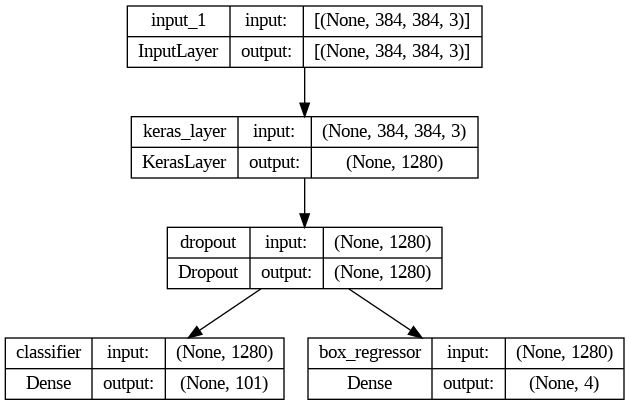

In [ ]:
# Visualizing the architecture of the model
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

## **Train the Model**

In [ ]:
# Custom callback that uses two monitors to stop training
class CustomEarlyStopping(tf.keras.callbacks.Callback):
  def __init__(self, monitor_1, monitor_2, patience=0, restore_best_weights=False):
    super().__init__()
    self.monitor_1 = monitor_1
    self.monitor_2 = monitor_2
    self.patience = patience
    self.restore_best_weights = restore_best_weights
    self.best = {monitor_1: -float("inf"), monitor_2: -float("inf")}
    self.wait = 0
    self.stopped_epoch = 0
    self.best_weights = None

  def on_train_begin(self, logs=None):
    if self.restore_best_weights:
      self.best_weights = self.model.get_weights()

  def on_epoch_end(self, epoch, logs=None):
    logs = logs or {}
    current_1 = logs.get(self.monitor_1)
    current_2 = logs.get(self.monitor_2)

    if current_1 is None or current_2 is None:
      return

    if (current_1 > self.best[self.monitor_1]) and (current_2 > self.best[self.monitor_2]):
        self.best[self.monitor_1] = current_1
        self.best[self.monitor_2] = current_2
        self.wait = 0
        if self.restore_best_weights:
          self.best_weights = self.model.get_weights()
    else:
      self.wait += 1

    if self.wait >= self.patience:
      self.stopped_epoch = epoch
      self.model.stop_training = True
      if self.restore_best_weights:
        self.model.set_weights(self.best_weights)

In [ ]:
# Callback to stop training if validation accuracy and IoU don't improve for 5 epochs
patience = 5
callback = CustomEarlyStopping(
    monitor_1="val_classifier_accuracy",
    monitor_2="val_box_regressor_metric_iou",
    patience=patience,
    restore_best_weights=True
)

In [ ]:
history = model.fit(train_dataset, epochs=epochs, validation_data=test_dataset, callbacks=[callback])

Epoch 1/50
108/108 [==============================] - 175s 372ms/step - loss: 4.2773 - classifier_loss: 1.9706 - box_regressor_loss: 0.7689 - classifier_accuracy: 0.5888 - box_regressor_metric_iou: 0.6626 - val_loss: 2.2942 - val_classifier_loss: 0.3320 - val_box_regressor_loss: 0.6541 - val_classifier_accuracy: 0.9288 - val_box_regressor_metric_iou: 0.7046
Epoch 2/50
108/108 [==============================] - 28s 256ms/step - loss: 2.3659 - classifier_loss: 0.4804 - box_regressor_loss: 0.6285 - classifier_accuracy: 0.9008 - box_regressor_metric_iou: 0.7153 - val_loss: 1.8199 - val_classifier_loss: 0.1435 - val_box_regressor_loss: 0.5588 - val_classifier_accuracy: 0.9659 - val_box_regressor_metric_iou: 0.7464
Epoch 3/50
108/108 [==============================] - 27s 243ms/step - loss: 1.9172 - classifier_loss: 0.2669 - box_regressor_loss: 0.5501 - classifier_accuracy: 0.9508 - box_regressor_metric_iou: 0.7478 - val_loss: 1.5769 - val_classifier_loss: 0.1287 - val_box_regressor_loss: 0.

**Save the model**

In [ ]:
trained_model_path = "/content/drive/MyDrive/models/ObjectDetection_EfficientNetV2-S_Caltech-101"
model.save(trained_model_path)

## **Model Evaluation**

In [ ]:
metrics_train = model.evaluate(train_dataset, verbose=0)
metrics_test = model.evaluate(test_dataset, verbose=0)

print(f"Train\tLoss: {metrics_train[0]}; IoU: {metrics_train[-1]}; Accuracy: {metrics_train[-2]}")
print(f"Test\tLoss: {metrics_test[0]}; IoU: {metrics_test[-1]}; Accuracy: {metrics_test[-2]}")

Train	Loss: 0.676272451877594; IoU: 0.8926478028297424; Accuracy: 0.9984085559844971
Test	Loss: 0.8738770484924316; IoU: 0.8789441585540771; Accuracy: 0.9820601940155029


### **Graphs of the metrics**

In [ ]:
# Library needed to convert Plotly interactive graphics into images
!pip install kaleido -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 13.5 MB/s eta 0:00:00


In [ ]:
# Function to plot the metrics
def plot_metrics(history=history.history, metrics=["loss"], renderer=None, with_patience=True):
  epochs = len(history["loss"])
  list_epochs = np.arange(1, epochs+1)
  num_metrics = len(metrics)

  for metric in metrics[:num_metrics]:
    values = history[metric]
    val_values = history[f"val_{metric}"]
    metric = "IoU" if "iou" in metric else metric.split("_")[-1].capitalize()

    fig=go.Figure()
    fig.add_trace(go.Scatter(x=list_epochs, y=values, name=metric, line=dict(color="blue", width=2)))
    fig.add_trace(go.Scatter(x=list_epochs, y=val_values, name=f"Val {metric}", line=dict(color="#FF6600", width=2)))

    if with_patience:
      fig.add_vline(
          x=epochs-patience, line=dict(color="red", width=2, dash="dash"),
          annotation_text="End of Training", annotation_position="top left",
          annotation=dict(font_size=12, font_color="red")
      )

    fig.update_xaxes(title_text="Epoch")
    fig.update_yaxes(title_text=metric)
    fig.update_layout(
        title=f"Evolution of {metric} across Epochs",
        title_font=dict(size=20),
        title_x=0.5,
        height=500,
        width=1200
    )

    fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics(metrics=["classifier_accuracy", "box_regressor_metric_iou", "loss"])

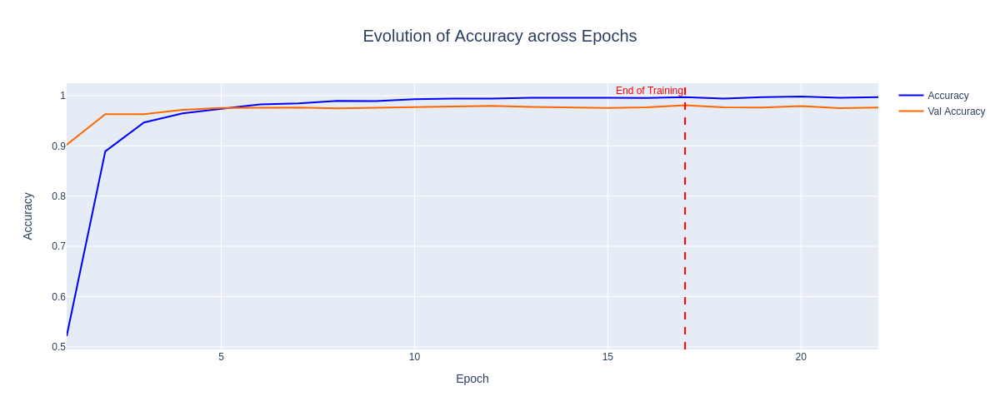

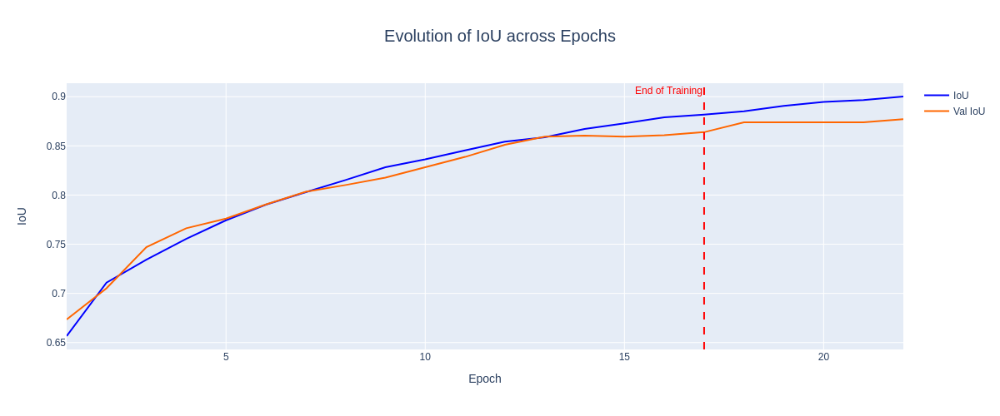

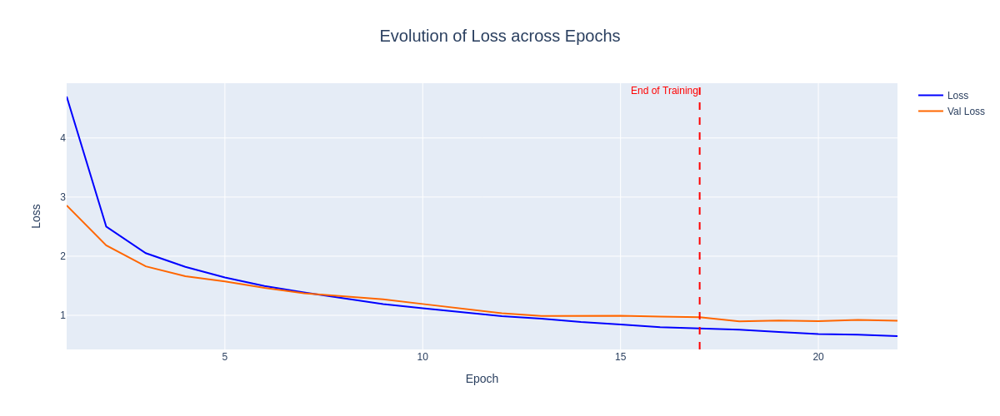

In [ ]:
# Static image for GitHub
plot_metrics(metrics=["classifier_accuracy", "box_regressor_metric_iou", "loss"], renderer="png")

### **Confusion Matrix**

In [ ]:
# Extract images, labels and boxes from the test dataset
images_test = test_dataset.unbatch().map(lambda x, y: x)
images_test = np.array(list(images_test.as_numpy_iterator()))

labels_test = test_dataset.unbatch().map(lambda x, y: y[0])
labels_test = np.array(list(labels_test.as_numpy_iterator()))

boxes_test = test_dataset.unbatch().map(lambda x, y: y[1])
boxes_test = np.array(list(boxes_test.as_numpy_iterator()))

# Generate predictions with the trained model
predictions = model.predict(test_dataset, verbose=1)
labels_test_pred = np.argmax(predictions[0], axis=-1)
boxes_test_pred = predictions[1]

# Consolidating the accuracy of the test dataset
print("Accuracy:", np.mean(labels_test == labels_test_pred))
print(f"F1 Score: {f1_score(labels_test, labels_test_pred, average='macro')}")

27/27 [==============================] - 18s 50ms/step
Accuracy: 0.9820601851851852
F1 Score: 0.9722314992996077


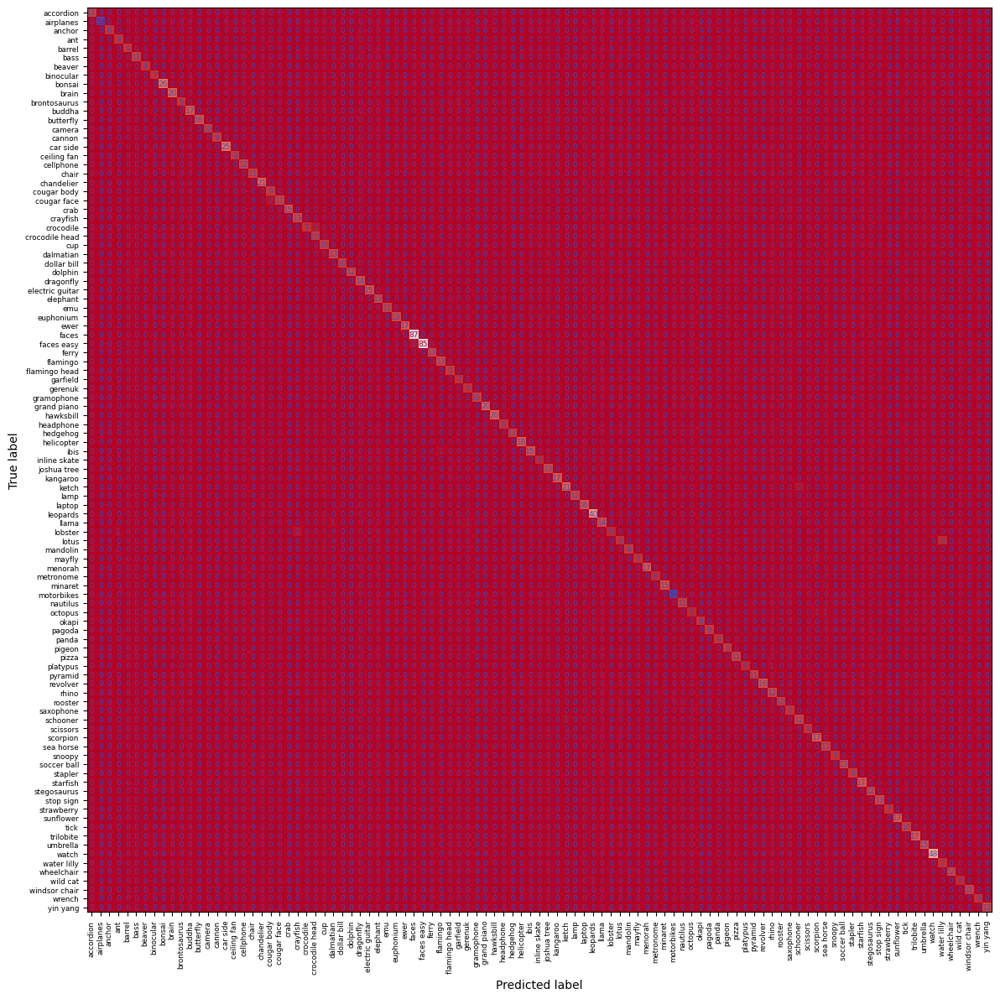

In [ ]:
cm = confusion_matrix(labels_test, labels_test_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=[name.lower() for name in class_names])
fig, ax = plt.subplots(figsize=(14, 14))
cmd.plot(ax=ax, colorbar=False, cmap="coolwarm_r", xticks_rotation="vertical")

for text in ax.texts:
  text.set_fontsize(6.5)

ax.tick_params(axis="x", labelsize=6.3)
ax.tick_params(axis="y", labelsize=6.3);

### **IoU Metric**

In [ ]:
iou_test = calculate_giou(boxes_test, boxes_test_pred).numpy()

print("Mean IoU:", iou_test.mean())
print("Min IoU:", iou_test.min())
print("Max IoU:", iou_test.max())
print(f"Percentage of detections with IoU >= 0.5: {np.mean(iou_test >= 0.5) * 100:.2f}%")
print(f"Percentage of detections with IoU >= 0.75: {np.mean(iou_test >= 0.75) * 100:.2f}%")
print(f"Percentage of detections with IoU >= 0.9: {np.mean(iou_test >= 0.9) * 100:.2f}%")

Mean IoU: 0.8789443
Min IoU: 0.0
Max IoU: 0.9952387
Percentage of detections with IoU >= 0.5: 98.44%
Percentage of detections with IoU >= 0.75: 90.34%
Percentage of detections with IoU >= 0.9: 56.02%


### **Analysis with a DataFrame**

Since the dataset contains many classes, the confusion matrix may not be as clear as desired. Therefore, it is advisable to display the evaluation results in a Pandas DataFrame for a more detailed and clearer view.

In [ ]:
# Create the DataFrame with the most relevant variables for analysis
df_eval = pd.DataFrame({
    "label": labels_test,
    "label_pred": labels_test_pred,
    "iou": iou_test
})

df_eval["name"] = df_eval.label.apply(lambda x: class_names[x])
df_eval["accuracy"] = df_eval.apply(lambda x: 100 if x["label"] == x["label_pred"]  else 0, axis=1)
df_eval.drop(columns=["label", "label_pred"], inplace=True)

df_eval.drop(columns=["name"]).mean()

,0
iou,0.878944
accuracy,98.206019


In [ ]:
# Group the DataFrame by class
df_eval = df_eval.groupby("name").mean()

# Round the digits of the variables appropriately
df_eval["iou"] = df_eval.iou.apply(lambda x: round(x, 4))
df_eval["accuracy"] = df_eval.accuracy.apply(lambda x: round(x, 2))

In [ ]:
# Classes with an accuracy lower than 90%
df_eval[df_eval.accuracy < 90].sort_values(by="accuracy", ascending=False)

,iou,accuracy
name,,
Beaver,0.7053,88.89
Brontosaurus,0.9170,88.89
Llama,0.8630,87.50
Mayfly,0.7121,87.50
Wild cat,0.8514,85.71
Cougar face,0.8229,84.62
Platypus,0.8495,83.33
Octopus,0.9355,71.43
Crocodile,0.7713,70.00


In [ ]:
# Number of classes with an accuracy equal to 100%
df_eval[df_eval.accuracy == 100].shape[0]

83

In [ ]:
# Number of classes with an average IoU lower than 0.75
df_eval[df_eval.iou < 0.75].sort_values(by="iou", ascending=False)

,iou,accuracy
name,,
Mayfly,0.7121,87.50
Crocodile head,0.7112,100.00
Beaver,0.7053,88.89
Anchor,0.6558,100.00


In [ ]:
# Number of classes with IoU greater than or equal to 0.9
df_eval[df_eval.iou >= 0.9].shape[0]

27

## **Predictions on the Test Dataset**

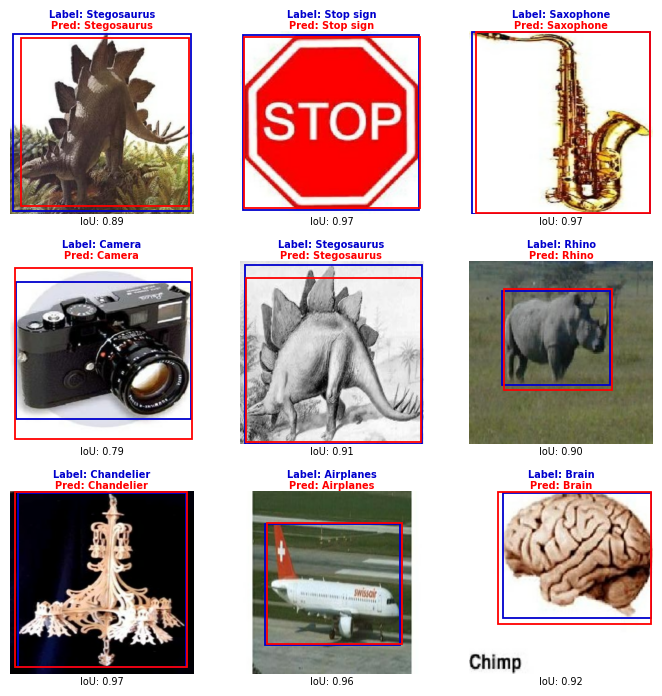

In [ ]:
show_images(images_test, labels_test, boxes_test, labels_test_pred, boxes_test_pred)

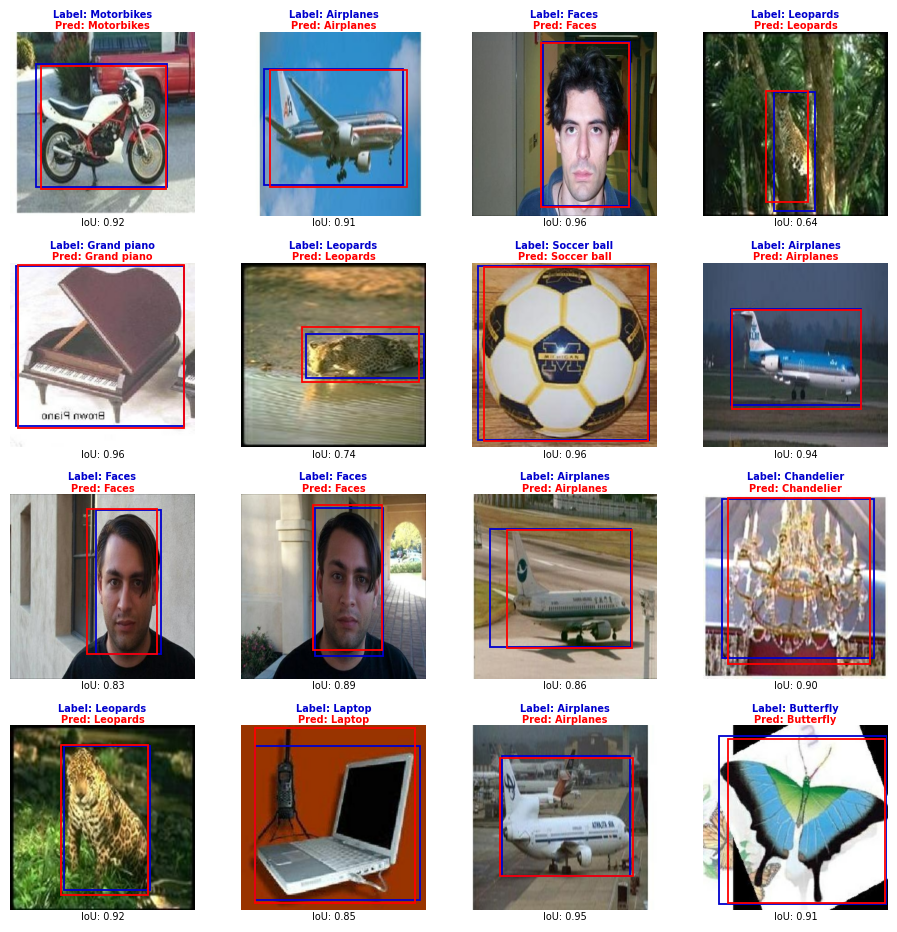

In [ ]:
show_images(
    images_test, labels_test, boxes_test, labels_test_pred, boxes_test_pred,
    num_examples=16, random=False
)

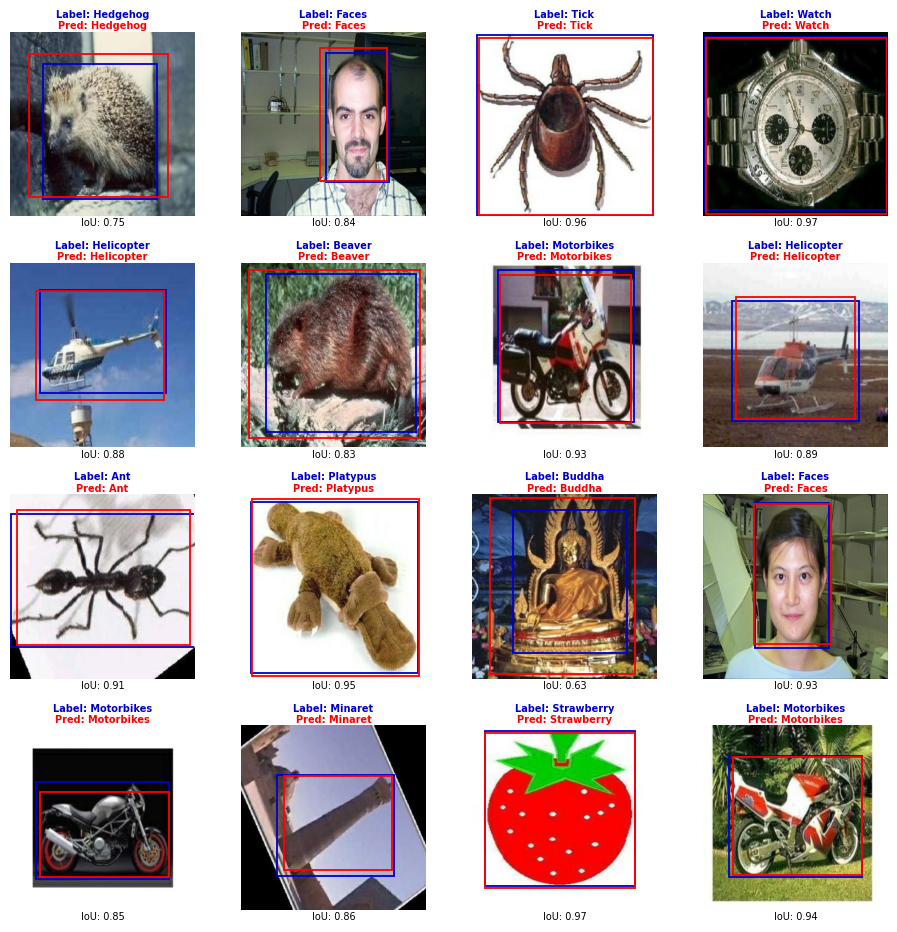

In [ ]:
show_images(
    images_test, labels_test, boxes_test, labels_test_pred, boxes_test_pred,
    num_examples=16
)

**Predictions with IoU less than 0.5**

In [ ]:
indices = np.where(iou_test < 0.5)[0]
indices.shape

(27,)

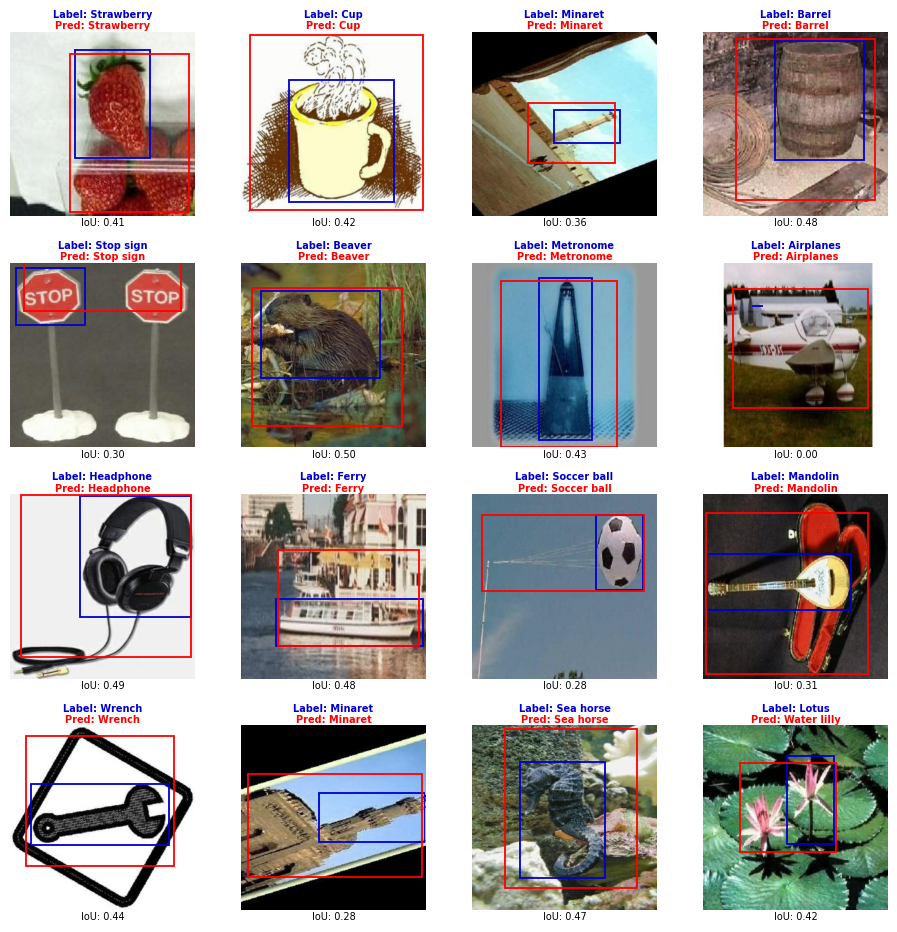

In [ ]:
show_images(
    images_test[indices], labels_test[indices], boxes_test[indices],
    labels_test_pred[indices], boxes_test_pred[indices],
    num_examples=16
)

It can be observed that the prediction with an IoU of 0 is due to the fact that the real bounding box was incorrectly annotated.

**Predictions with IoU greater than or equal to 0.95**

In [ ]:
indices = np.where(iou_test >= 0.95)[0]
indices.shape

(365,)

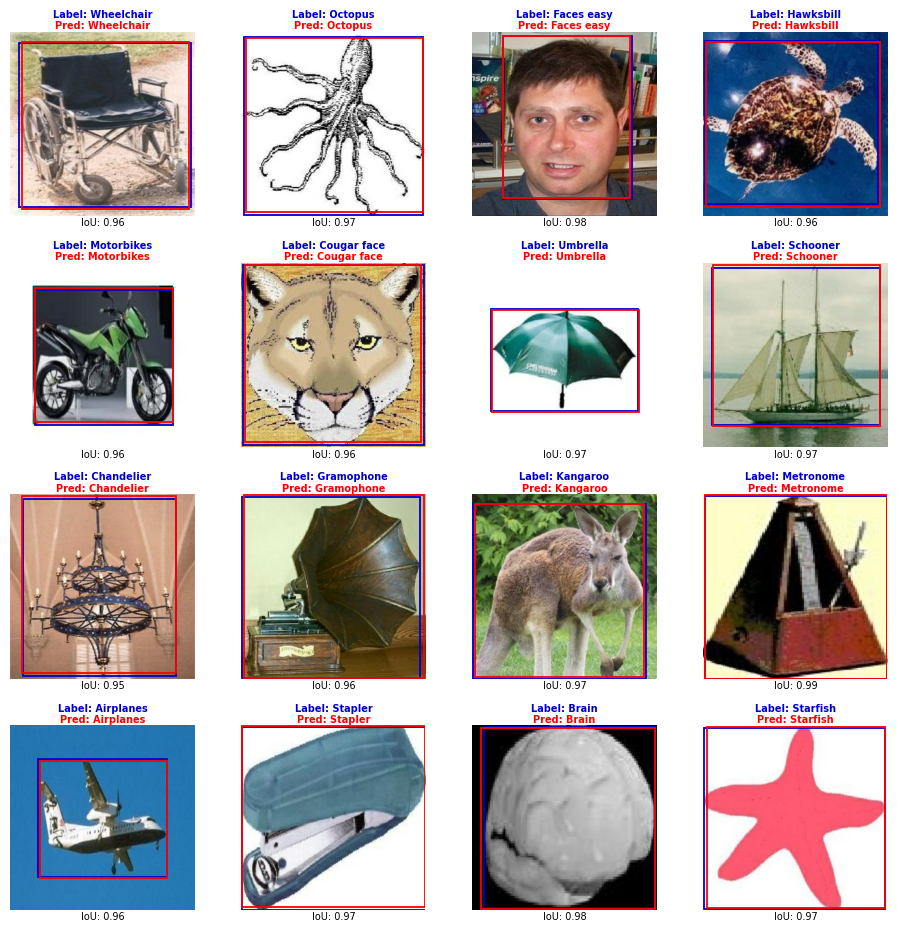

In [ ]:
show_images(
    images_test[indices], labels_test[indices], boxes_test[indices],
    labels_test_pred[indices], boxes_test_pred[indices],
    num_examples=16
)

**Incorrect classifier predictions**

In [ ]:
indices = np.where(labels_test != labels_test_pred)[0]
indices.shape

(31,)

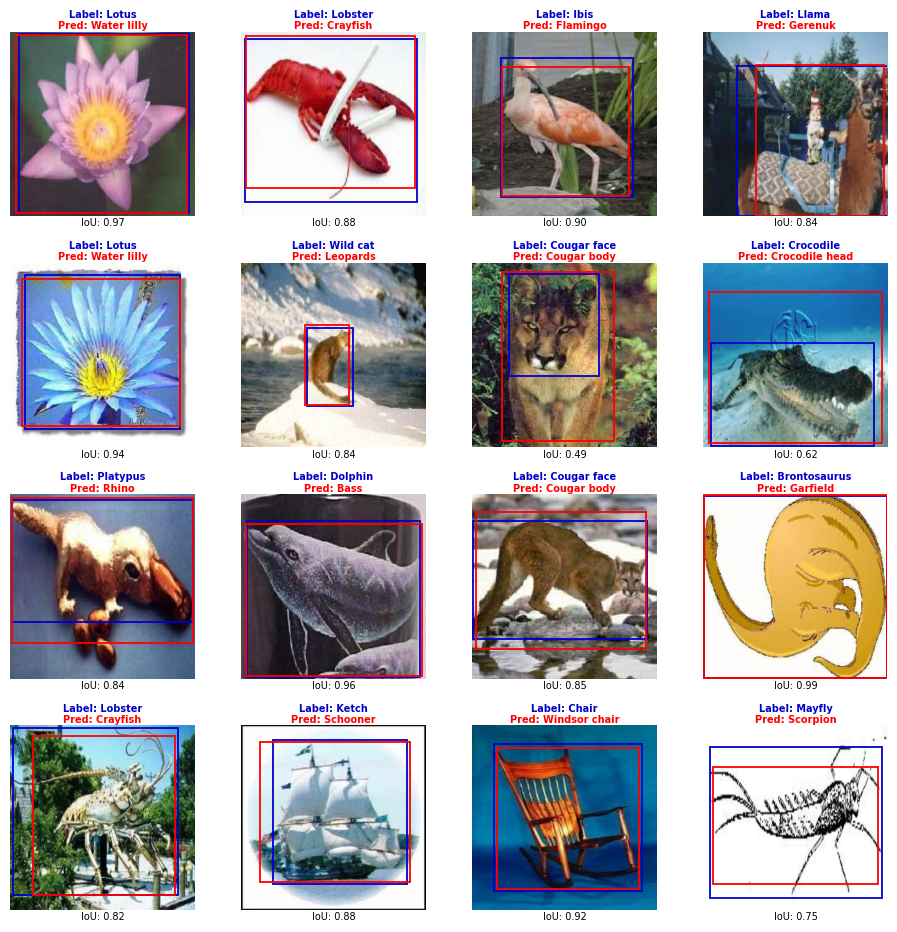

In [ ]:
show_images(
    images_test[indices], labels_test[indices], boxes_test[indices],
    labels_test_pred[indices], boxes_test_pred[indices],
    num_examples=16
)

## **Predictions with Images from the Internet**

In [ ]:
# Load the fine-tuned model
tf.keras.backend.clear_session()

model = tf.keras.models.load_model(trained_model_path)
model.summary()

Model: "EfficientNetV2-S"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384, 384, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1280)                 2033136   ['input_1[0][0]']             
                                                          0                                       
                                                                                                  
 dropout (Dropout)           (None, 1280)                 0         ['keras_layer[0][0]']         
                                                                                                  
 classifier (Dense)          (None, 101)                  129381    ['dropout[0][0]

In [ ]:
# Function for object detection in images from the internet
def caltech_detection_url(list_urls, save=False, path_save=""):
  n = int(np.sqrt(len(list_urls)))

  # Download the images and convert them to NumPy arrays
  images = []

  for url in list_urls:
    path = tf.keras.utils.get_file(origin=url)
    image = tf.keras.utils.load_img(path)
    images.append(np.array(image))

  # Preprocess the images
  inputs = tf.stack([tf.image.resize(image, new_size[:-1]) for image in images])
  inputs = inputs / 255

  # Predict the classes and the coordinates of the bounding boxes
  predictions = model.predict(inputs, verbose=0)
  logits = predictions[0].max(axis=-1)
  pred_labels = np.argmax(predictions[0], axis=-1)
  pred_labels = class_names[pred_labels]
  pred_boxes = predictions[1]

  fig, axes = plt.subplots(n, n, figsize=(3.5*n, 3.5*n))

  for i, ax in enumerate(axes.flat):
    image = images[i]
    shape = image.shape
    label = pred_labels[i]
    logit = logits[i]
    box = pred_boxes[i]

    ax.imshow(image)

    ymin, xmin, ymax, xmax = tuple(box)
    ymin, ymax = ymin*shape[0], ymax*shape[0]
    xmin, xmax = xmin*shape[1], xmax*shape[1]
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.5, edgecolor="mediumblue", facecolor="none")
    ax.add_patch(rect)

    ax.text(
        x=xmin+shape[1]*0.007, y=ymin-shape[0]*0.013, s=f"{label}:  {logit*100:.1f}%",
        color="black", fontsize=7, fontweight="bold", ha="left", va="bottom",
        bbox={"boxstyle":"square", "facecolor": "blue", "edgecolor":"blue", "alpha":0.7}
    )

    ax.axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

In [ ]:
list_urls = [
    "https://images.unsplash.com/photo-1582360113507-e22478766daf?fm=jpg&q=60&w=3000&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxzZWFyY2h8Mnx8Qm9laW5nJTIwNzg3JTIwOXxlbnwwfHwwfHx8MA%3D%3D",
    "https://cdn.britannica.com/55/234355-050-6B07C130/Saltwater-crocodile.jpg",
    "https://static.wikia.nocookie.net/garfield/images/f/fb/Garfieldshow.jpg.jpg/revision/latest/scale-to-width/360?cb=20240429182216",
    "https://thenaturalpondstore.com.au/cdn/shop/articles/pinkwaterlily.jpg?v=1658805049",

    "https://media.licdn.com/dms/image/C5612AQH2qgp_Fu1xbQ/article-cover_image-shrink_720_1280/0/1650992522529?e=2147483647&v=beta&t=MvN8rKbXKO9udQH50vpscStZnABnTx01Pz0uZ6KOwW0",
    "https://images.rawpixel.com/image_800/czNmcy1wcml2YXRlL3Jhd3BpeGVsX2ltYWdlcy93ZWJzaXRlX2NvbnRlbnQvbHIvMjc2LXBvbTc0ODgtamouanBn.jpg",
    "https://substackcdn.com/image/fetch/f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fbucketeer-e05bbc84-baa3-437e-9518-adb32be77984.s3.amazonaws.com%2Fpublic%2Fimages%2F71c04730-80c6-42a7-af65-2503469af9ce_800x600.jpeg",
    "https://static.toiimg.com/thumb/resizemode-4,width-1280,height-720,msid-95789962/95789962.jpg",
    "https://blog.nature.org/wp-content/uploads/2022/05/Lince_ibe%CC%81rico_Lynx_pardinus_Almuradiel_Ciudad_Real_Espan%CC%83a_2021-12-19_DD_06.jpg",
    "https://t3.ftcdn.net/jpg/07/63/63/84/360_F_763638459_jEn0BcWPlXYzUyY66ZIZQnSE2p7Bcru9.jpg",
    "https://fotografias.larazon.es/clipping/cmsimages01/2019/08/06/CF1901D0-39EF-4A3C-BD36-E7292BE806A2/98.jpg?crop=949,534,x8,y0&width=1900&height=1069&optimize=low&format=webply",
    "https://excursionesjesustenerife.com/media/sailboat-trip-tenerife/velero-catamaran-excursion-trip-tenerife-cheap-lowcost-puerto-colon-dolphins-whales-buffet-open-bar-free-drinks-nature-sail-boat-swim-bath5.jpg",
    "https://www.oceanactionhub.org/storage/2023/12/Seahorses-are-not-dangerous.jpg",

    "https://lobsterandseafood.co.uk/wp-content/uploads/2023/10/Lobster.webp",
    "https://m.media-amazon.com/images/I/51pzejMM8IL._AC_UF350,350_QL80_.jpg",
    "https://www.borispatagonia.com/images/mag/lama.webp",
    "https://cdn.britannica.com/53/117053-050-6B05C512/Rock.jpg",
    "https://img.freepik.com/fotos-premium/ilustracion-vibrante-estegosaurio-paisaje-prehistorico-concepto-dinosaurios-vida-silvestre-antigua-naturaleza-contenido-educativo-dinosaurio_981050-20161.jpg?size=626&ext=jpg&ga=GA1.1.2008272138.1726185600&semt=ais_hybrid",
    "https://i.pinimg.com/474x/c3/5c/84/c35c84121aaea699769bf2623bb8bd56.jpg",
    "https://images.twinkl.co.uk/tw1n/image/private/t_630/u/ux/scorpion-651142-1920_ver_1.jpg",
    "https://www.cunninghampiano.com/cdn/shop/products/hallet_davis_942055_2__1677859346_824.jpg?v=1682266306",
    "https://5.imimg.com/data5/NJ/VB/DM/SELLER-1985769/trm-eb-alto-saxophone-gold-lacquer-500x500.JPG"
]

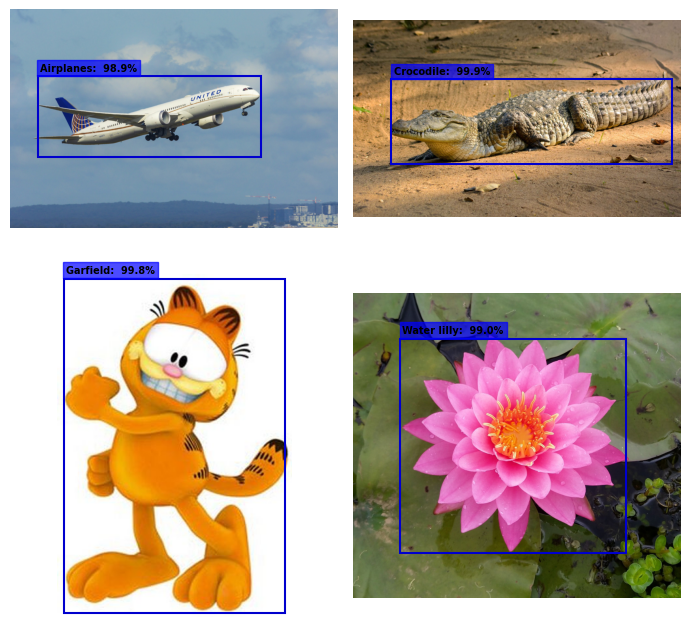

In [ ]:
caltech_detection_url(list_urls[:4])

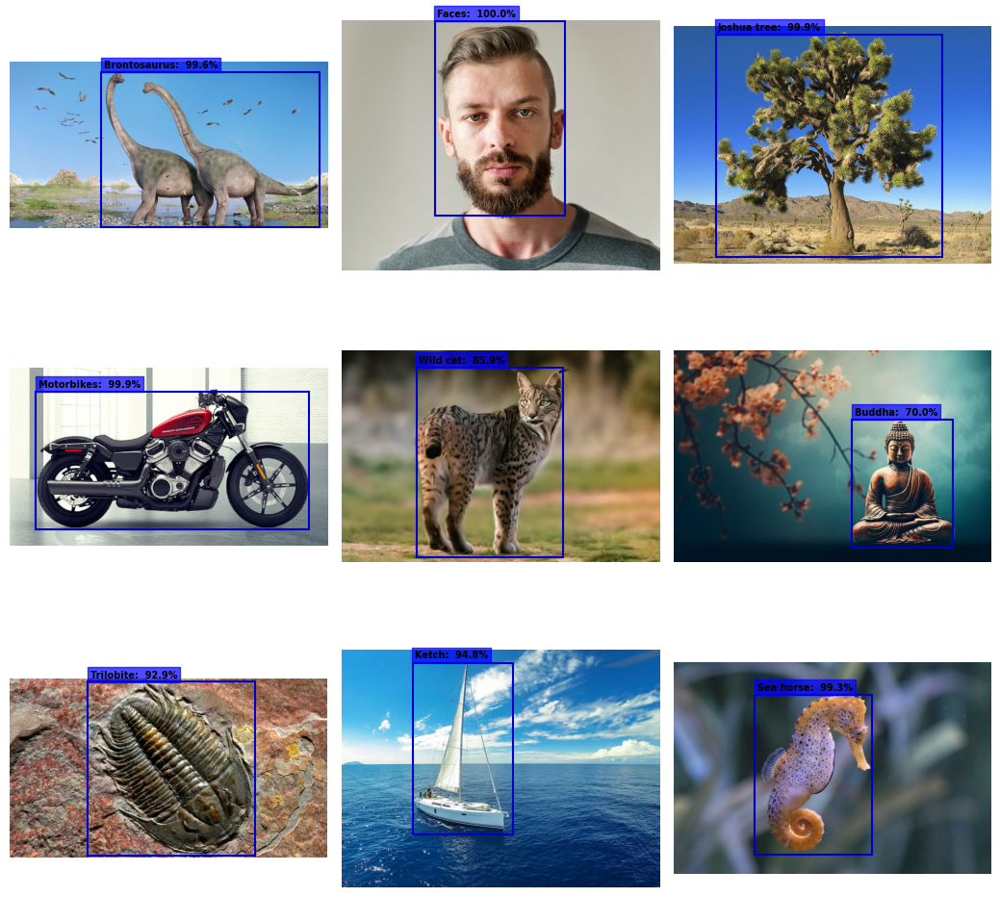

In [ ]:
caltech_detection_url(list_urls[4:13], save=True, path_save="ObjectDetection_EfficientNetV2S_Caltech-101")

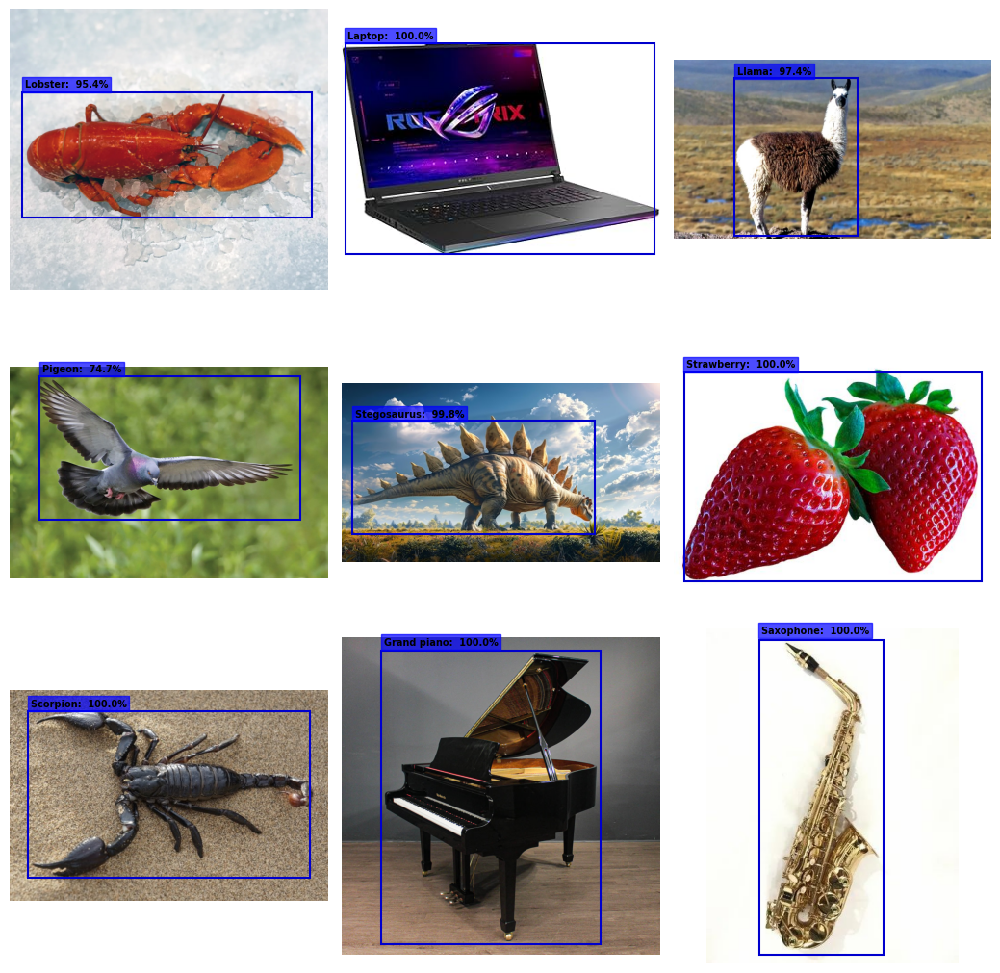

In [ ]:
caltech_detection_url(list_urls[13:])

**Conclusion**: The fine-tuned model achieved **99.84%** **accuracy** and an **average IoU** of **0.8926** on the **training dataset**, and **98.21%** **accuracy**, an **f1 score** of **97.22%**, and an **average IoU** of **0.8789** on the **test dataset**. These results indicate that the classifier performs exceptionally well, while the box regressor shows medium-high performance. There is slight overfitting, which was mitigated by data augmentation and a custom callback. Based on the metric graphs, the average IoU could still improve with more epochs, but this would lower the accuracy. Therefore, the polynomial learning rate schedule and the custom callback helped achieve the best possible balance. To further improve the IoU, expanding the Caltech-101 dataset with more images from the 101 classes and their corresponding bounding boxes would be necessary. This would prevent the classifier loss from converging too quickly and allow for the use of larger, more advanced models than EfficientNetV2-S, improving both classifier and regressor performance. Despite these limitations, significant results have been achieved given the limited and imbalanced dataset.